Imports

In [2]:
using NPZ
using Gen
using Plots
using LinearAlgebra
using Flux
using Plots
using PyPlot
using ProgressBars

## Create the generative model for binary classification.

In [3]:
@gen function BayesianNeuralNetwork(x::Matrix{Float64},reconstruct)

    (N, D) = size(x)

    # create the prior distribution for the model 
    model_params = Float64[]
    for i = 1:size(parameters_initial)[1]
        push!(model_params,{(:model_param,i)} ~ normal(0,1))
    end

    # create a model instance that is initialized with the computed prior distribution 
    model = reconstruct(model_params)
    
    # forward the data throught the model to make predictions
    outputs = Vector[]
    for i = 1:N
        output = model(x[i,:])
        push!(outputs,output)
    end

    # observe each prediction
    y = Float64[]
    for j = 1:N
        push!(y,{(:y,j)} ~ bernoulli(Real(outputs[j][1])))
    end;

    y
end


DynamicDSLFunction{Any}(Dict{Symbol, Any}(), Dict{Symbol, Any}(), Type[Matrix{Float64}, Any], false, Union{Nothing, Some{Any}}[nothing, nothing], var"##BayesianNeuralNetwork#312", Bool[0, 0], false)

## Create the generative model for multiclass classification.

In [4]:
@gen function BayesianNeuralNetwork_mc(x::Matrix{Float64},reconstruct)

    (N, D) = size(x)

    # create the prior distribution for the model 
    model_params = Float64[]
    for i = 1:size(parameters_initial)[1]
        push!(model_params,{(:model_param,i)} ~ normal(0,1))
    end

    # create a model instance that is initialized with the computed prior distribution 
    model = reconstruct(model_params)
    
    # forward the data throught the model to make predictions
    outputs = Vector[]
    for i = 1:N
        output = model(x[i,:])
        push!(outputs,output)
    end

    # observe each prediction
    y = Float64[]
    for j = 1:N
        push!(y,{(:y,j)} ~ categorical(outputs[j]))
    end;

    y
end


DynamicDSLFunction{Any}(Dict{Symbol, Any}(), Dict{Symbol, Any}(), Type[Matrix{Float64}, Any], false, Union{Nothing, Some{Any}}[nothing, nothing], var"##BayesianNeuralNetwork_mc#313", Bool[0, 0], false)

## Create a mcmc inference structure.

In [5]:
function make_constraints(ys::Matrix{Float64})
    constraints = Gen.choicemap()
    for i=1:size(ys)[1]
        constraints[(:y, i)] = ys[i][1]
    end
    constraints
end;

In [6]:
function block_resimulation_update(tr, no_parameters)

    for i = 1:no_parameters
        latent_variable = select((:model_param, i))
        (tr, _) = mh(tr, latent_variable)
    end

    tr
end

block_resimulation_update (generic function with 1 method)

In [7]:
function block_resimulation_inference(model, n_burnin, n_samples, reconstruct, X_train, Y_train, X_test, Y_test, no_parameters, multiclass)
    observations = make_constraints(Y_train)
    if multiclass
        (tr, _) = generate(BayesianNeuralNetwork_mc, (X_train,reconstruct,), observations)
    else
        (tr, _) = generate(BayesianNeuralNetwork, (X_train,reconstruct,), observations)
    end
    acc_list = []
    println("______________Burning phase______________")
    for iter=1:n_burnin
        tr = block_resimulation_update(tr,no_parameters)
        push!(acc_list,get_acc_from_trace(tr,X_test,Y_test,model))
        if iter % 1000 == 0 
            println("Iteration:$iter")
        end
    end
    trs = []
    println("______________Training______________")
    loss_list = []
    for iter=1:n_samples
        tr = block_resimulation_update(tr, no_parameters)
        push!(acc_list,get_acc_from_trace(tr,X_test,Y_test,model))
        push!(trs, tr)
        if iter % 1000 == 0 
            println("Iteration:$iter")
        end
    end

    model_params = Float64[]
    for i = 1:no_parameters
        push!(model_params,trs[end][((:model_param, i))])
    end
    

    acc_last_trs_train = get_acc_from_trace(trs[end],X_train,Y_train,model)
    acc_last_trs_test = get_acc_from_trace(trs[end],X_test,Y_test,model)
    mean_acc = get_mean_acc(trs,X_train,Y_train,model);
    
    println("Last sample of weights: $model_params")
    println("Accuracy on training data: $acc_last_trs_train")
    println("Accuracy on testing data: $acc_last_trs_test")
    println("Mean acc using all sampled weights: $mean_acc")
    # println(acc_list)
    plot_all_posterior_weights(trs, n_samples,no_parameters)
    trs
end;

### Create methods for computing metrics with the sampled weights, displaying the posterior of the sample weights and computing the mean accuracy.

In [8]:
function get_acc_from_trace(last_trace, input, actual_labels, model)

    # create a new model
    (N, D) = size(input)

    
    parameters_initial, reconstruct_2 = Flux.destructure(model)

    # extract the model parameters from the trace 
    model_params = Float64[]
    for i = 1:size(parameters_initial)[1]
        push!(model_params,last_trace[((:model_param, i))])
    end

    # instantiace the model with the extracted parameters
    model = reconstruct_2(model_params)

    # pass data throught the model
    outs = Vector[]
    for i = 1:N
        out = model(input[i,:])
        push!(outs,out)
    end

    # Transform outs
    results = Float64[]
    for i=1:N
        tmp = outs[i][1]
        if tmp > 0.5
            push!(results,1.0)
        else 
            push!(results,0.0)
        end
    end

    # compute accuracy 
    S = 0.0
    nr = 0.0
    for i=1:N
        if results[i] == actual_labels[i]
            S += 1
            nr += 1.0
        end
    end

    acc = S / nr

end


get_acc_from_trace (generic function with 1 method)

In [9]:
function get_mean_acc(trs, X, Y, model)
    no_traces = size(trs)[1]
    all_pred = 0.0
    for i=1:no_traces
        all_pred += get_acc_from_trace(trs[i],X,Y,model)
    end
    mean_acc = all_pred / no_traces
end    

get_mean_acc (generic function with 1 method)

In [10]:
function plot_all_posterior_weights(trs, n_samples,params)
    gr()
    for p=1:params
        # extracts all samples for a certain parameter and plot them
        w_sample = [trs[i][(:model_param, p)] for i=1:n_samples]
        display(histogram(w_sample, title="Posterior of parameter$p"))
    end

end

plot_all_posterior_weights (generic function with 1 method)

## Sanity check tests

______________Loaded_Data______________


Train_data


(100, 1)
(100, 2)
Test_data
(20, 2)
(20, 1)


______________Training_________________


______________Burning phase______________


Iteration:1000


Iteration:2000


Iteration:3000


Iteration:4000


Iteration:5000
______________Training______________


Iteration:1000


Iteration:2000


Iteration:3000


Iteration:4000


Iteration:5000

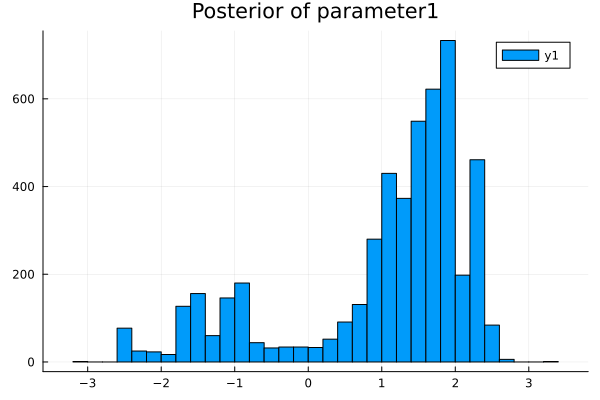

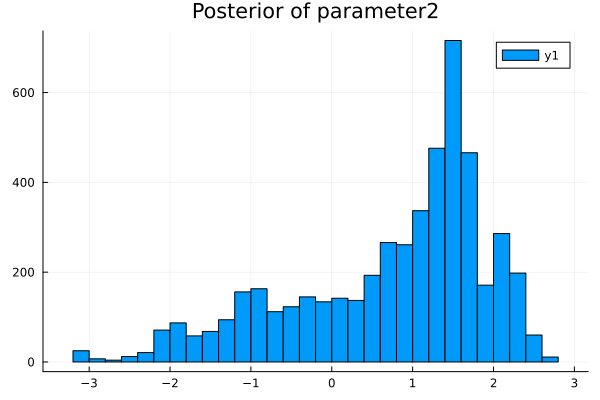

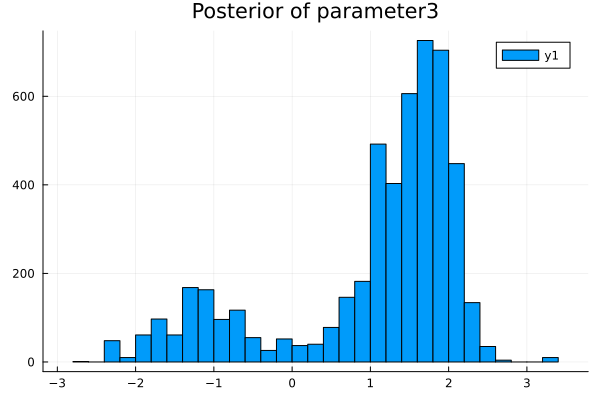

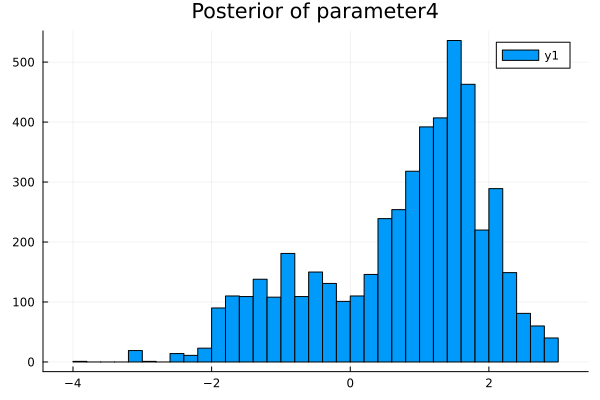

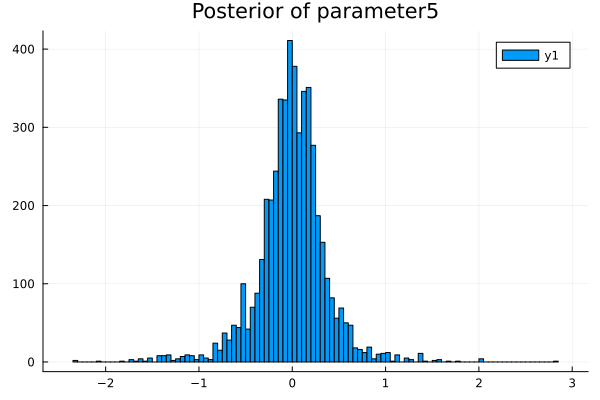

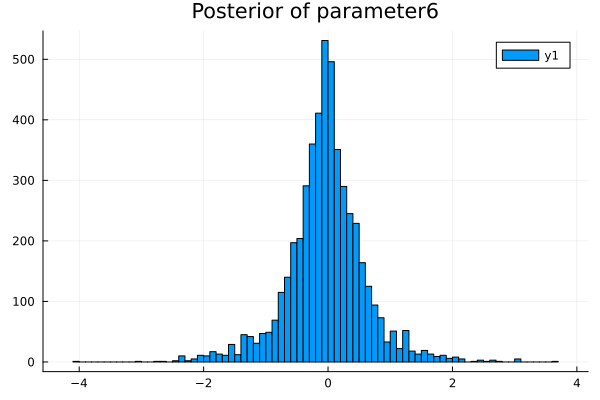

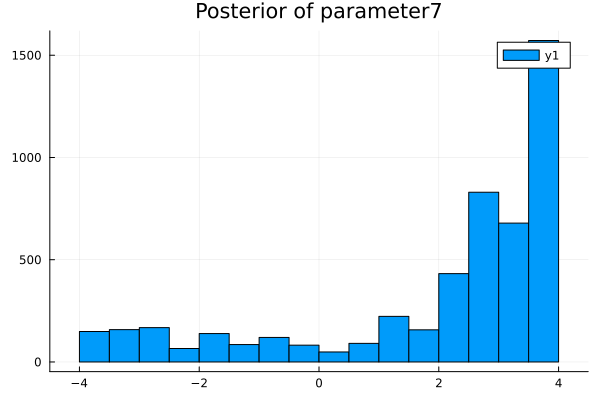

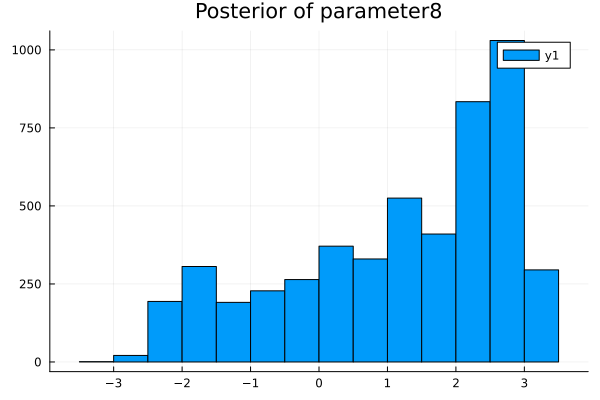

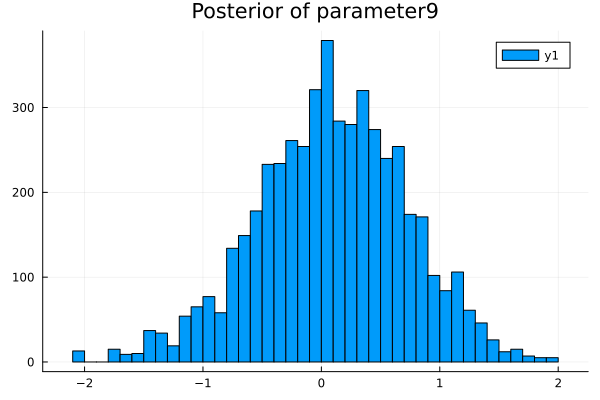


Last sample of weights: [2.3411339776523308, 2.1401616997381505, 3.3376289952218086, 1.4858832352438063, -0.4726929627483094, 0.29896079590030217, 1.823409384612229, 2.3205257706333797, 0.48093877070033086]
Accuracy on training data: 1.0
Accuracy on testing data: 1.0
Mean acc using all sampled weights: 1.0


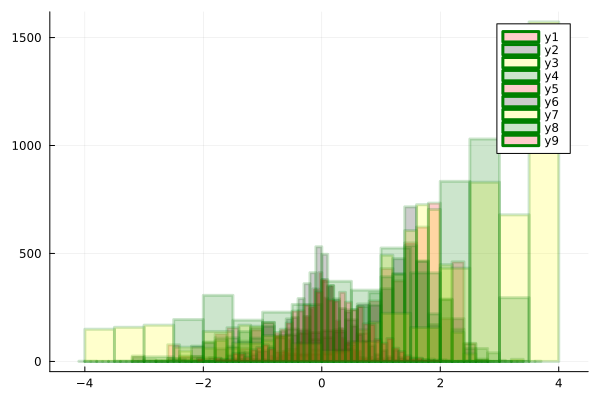

In [11]:
println("______________Loaded_Data______________")
sanity_inputs = npzread("./data/sanity_input.npy")
sanity_labels = npzread("./data/sanity_labels.npy")
sanity_test = npzread("./data/sanity_test.npy")
sanity_labels_test = npzread("./data/sanity_labels_test.npy")

println("Train_data")
println(size(sanity_labels))
println(size(sanity_inputs))
println("Test_data")
println(size(sanity_test))
println(size(sanity_labels_test))

model = Chain(
    Dense(2, 2, tanh), 
    Dense(2, 1, sigmoid)
    )

parameters_initial, reconstruct = Flux.destructure(model)
no_parameters = size(parameters_initial)[1]

println("______________Training_________________")
n_burnin = 5000
n_samples = 5000
trs = block_resimulation_inference(model,
                                   n_burnin,
                                   n_samples,
                                   reconstruct,
                                   sanity_inputs,
                                   sanity_labels,
                                   sanity_test,
                                   sanity_labels_test,
                                   no_parameters,
                                   false);
histogram([trs[i][(:model_param, p)] for i=1:5000 for p=1:9])
histogram(Any[[[trs[i][(:model_param, p)] for i=1:5000] for p=1:9]], line=(3,0.2,:green), fillcolor=[:red :black :yellow :green], fillalpha=0.2)

## Binary classification tests

______________Loaded_Data______________


Train_data
(400, 10)
(400, 1)
Test_data
(100, 10)
(100, 1)
______________Training_________________
______________Burning phase______________


Iteration:1000


Iteration:2000


Iteration:3000


Iteration:4000


Iteration:5000
______________Training______________


Iteration:1000


Iteration:2000


Iteration:3000


Iteration:4000


Iteration:5000


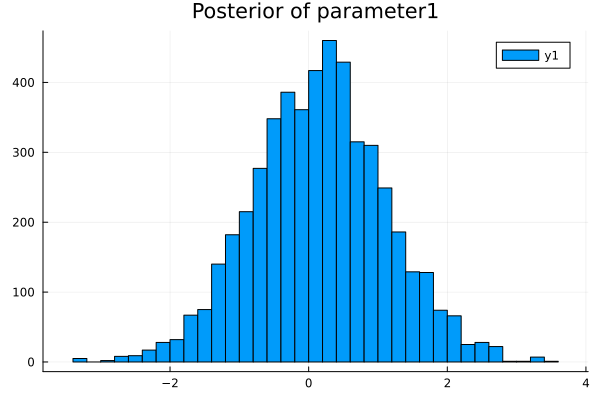

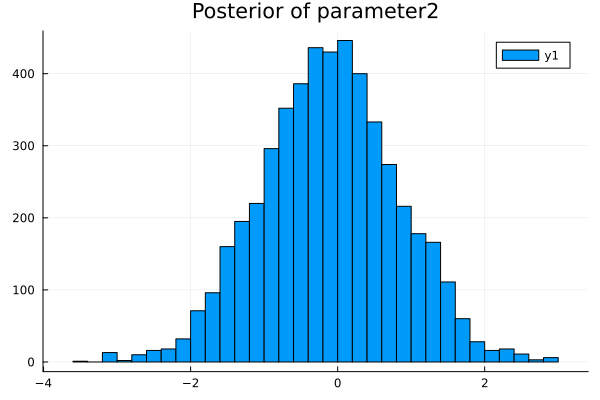

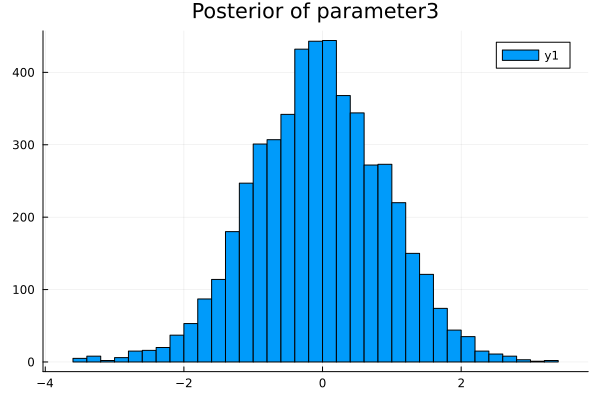

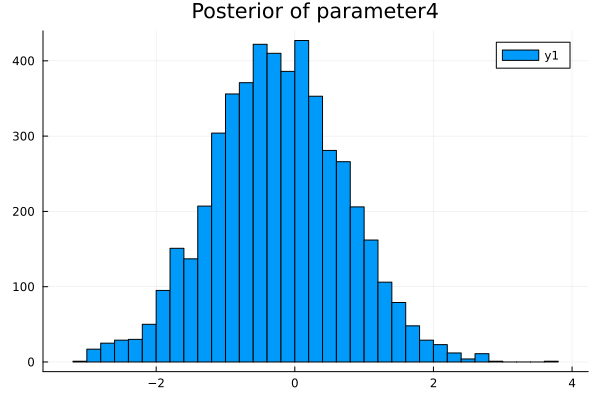

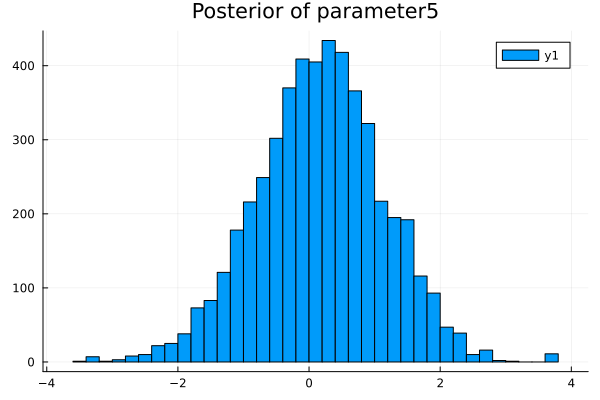

...

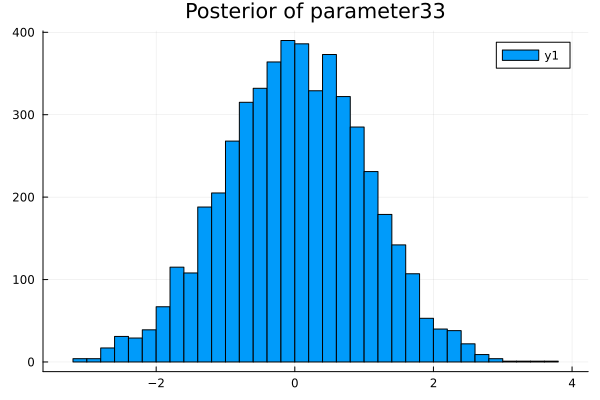

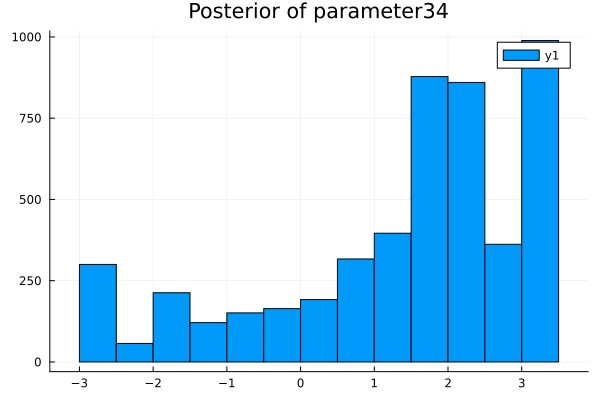

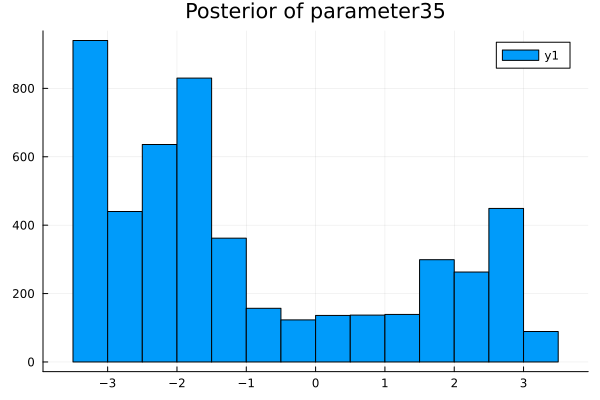

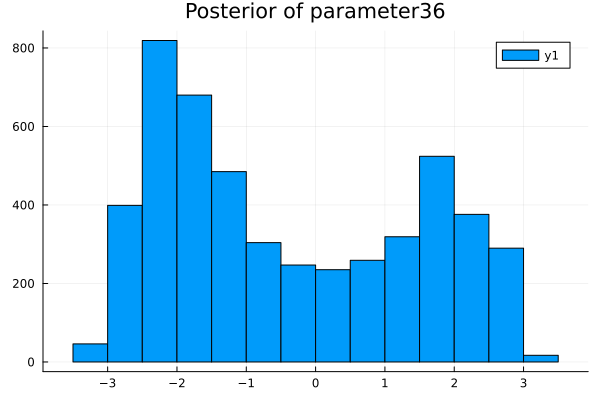

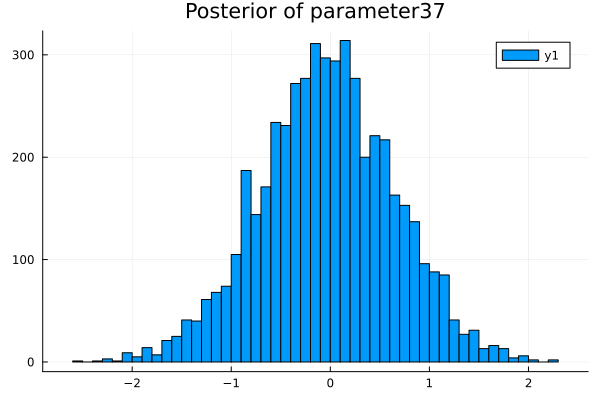

Last sample of weights: [0.09649940246177201, 1.151185855534408, -1.9746286349080313, -0.44056278338739696, 0.9634689654150445, -0.12938606567843416, 1.1572937139240667, 0.7854166228604528, -0.11271742852326765, -0.36284086687013706, 0.9768606377364455, 1.053714974894582, 0.3792491246603878, 0.9242380803296, 2.3523826287714886, 0.18474881077644864, 0.9637059033051696, 0.3337660787761891, 1.0406040722634944, 0.7007335844814376, 0.17831425254110675, -0.3685864619385499, -0.3090731131964549, 1.001624368555605, 1.4346684467798287, 1.2168865285012982, 0.30173195138279424, -0.07549470003512775, -0.8230343210411213, -1.0155987163577143, 0.17331497530699663, 0.6078210969648652, 1.0906691563918902, -0.8331129848864033, -2.985458270825775, -2.462478010998936, -0.7881779870562544]
Accuracy on training data: 1.0
Accuracy on testing data: 1.0
Mean acc using all sampled weights: 1.0

In [13]:
println("______________Loaded_Data______________")
binary_inputs = npzread("./data/binary_input2.npy")
binary_labels = npzread("./data/binary_labels2.npy")
binary_test = npzread("./data/binary_test2.npy")
binary_labels_test = npzread("./data/binary_labels_test2.npy")

println("Train_data")
println(size(binary_inputs))
println(size(binary_labels))
println("Test_data")
println(size(binary_test))
println(size(binary_labels_test))

model = Chain(
    Dense(10, 3, tanh), 
    Dense(3, 1, sigmoid)
    )

parameters_initial, reconstruct = Flux.destructure(model)
no_parameters = size(parameters_initial)[1]

println("______________Training_________________")
n_burnin = 5000
n_samples = 5000
trs = block_resimulation_inference(model,
                                   n_burnin,
                                   n_samples,
                                   reconstruct,
                                   binary_inputs,
                                   binary_labels,
                                   binary_test,
                                   binary_labels_test,
                                   no_parameters,
                                   false);

## Multi-class classification tests

______________Loaded_Data______________
Train_data
(400, 10)
(400, 1)
Test_data
(100, 10)
(100, 1)


______________Training_________________


______________Burning phase______________


Iteration:1000


Iteration:2000


Iteration:3000

Iteration:4000
Iteration:5000
______________Training______________


Iteration:1000


Iteration:2000


Iteration:3000


Iteration:4000


Iteration:5000


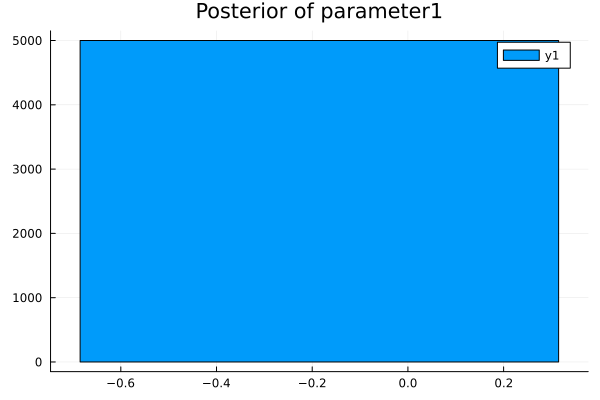

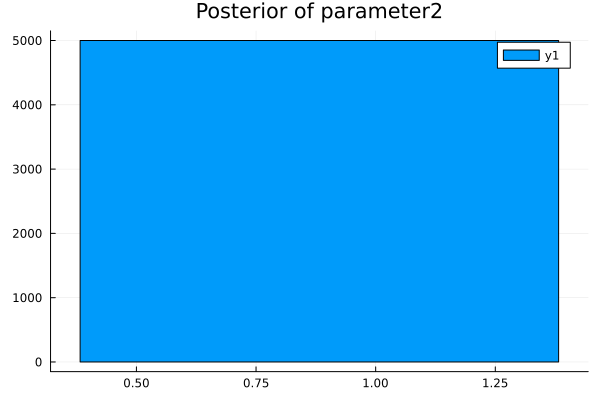

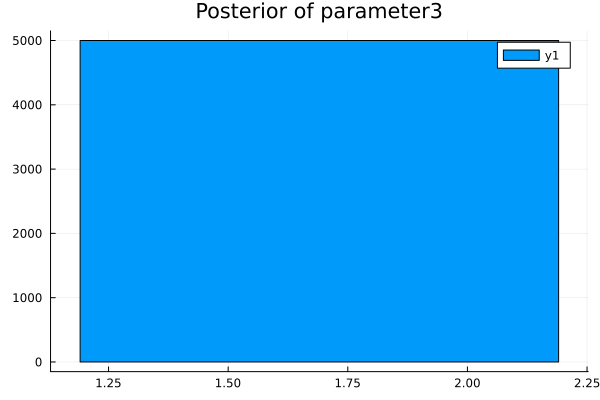

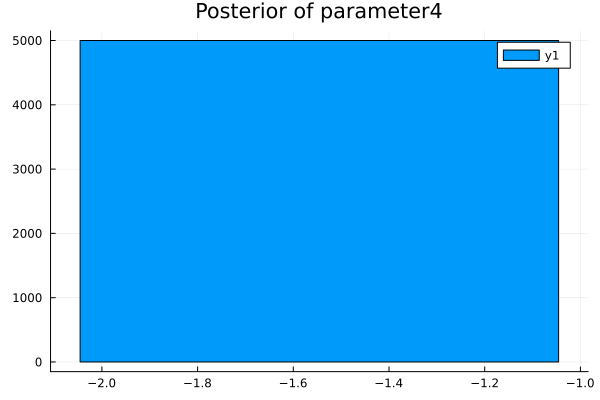

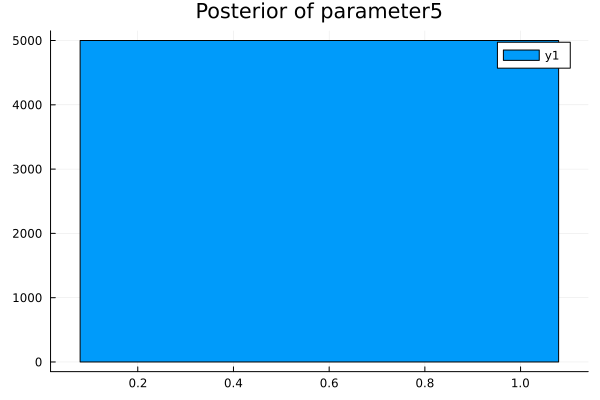

...

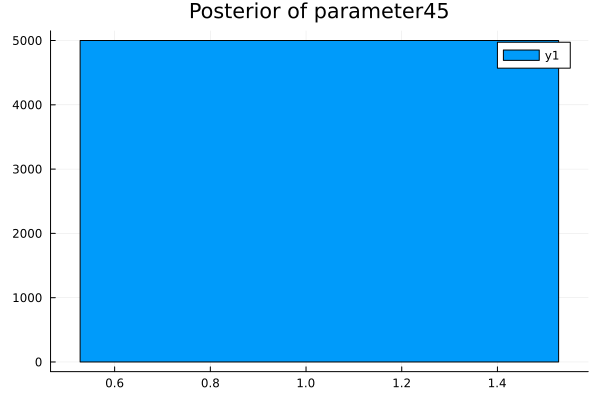

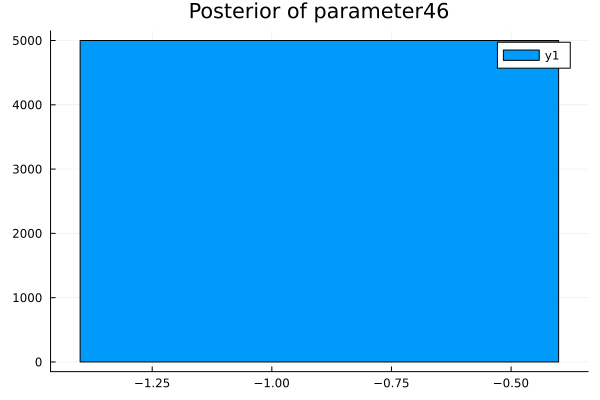

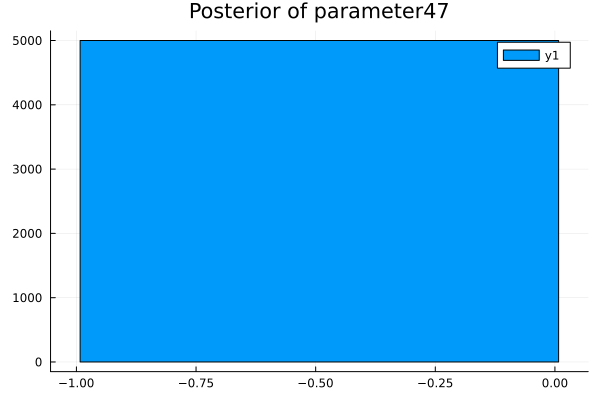

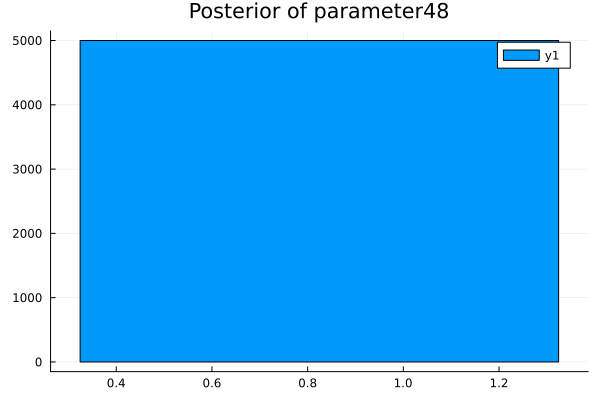

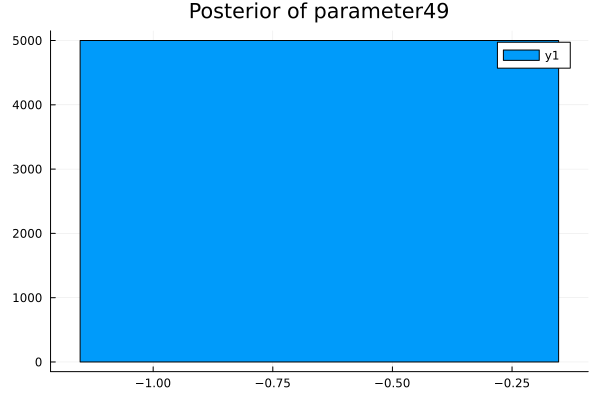

Last sample of weights: [-0.6850481384198046, 0.3823391118722466, 1.1905872750647954, -2.045526268490686, 0.07952405779179651, -1.08996081662306, -0.5828936753531029, 1.2479119004209054, -0.670837248186891, -0.6114951659751824, -0.36620898442296906, 0.7109552899269469, -0.7566522412539624, -0.6595019041796027, 0.9615331075985707, 1.923810047430275, 0.9482037195644769, 1.6823407912376072, -0.9047128296172997, -0.029185224763696064, 1.5243441186951603, 0.3588531077377266, -0.5509521944598427, 0.4571351995955977, -1.0155870711816453, 0.8830456265467059, 0.6689423471312377, 0.7620883691354287, 0.22111344322780094, 0.3163596971904353, -0.16949150427920054, 1.181527072917203, -0.41375680870437515, 0.608621910954277, 0.28903961191221766, 1.161625307144609, -1.2882740204090977, -1.2745791663135035, -0.30752443324812123, 0.20872316996243973, -0.07032865898529132, 1.223707031887916, -0.18559085313037266, 0.7598872799206978, 0.5278648981069525, -1.4006627366784887, -0.9922693782286042, 0.32451126

In [17]:
println("______________Loaded_Data______________")
multi_class_inputs = npzread("./data/binary_input4.npy")
multi_class_labels = npzread("./data/binary_labels4.npy")
multi_class_test = npzread("./data/binary_test4.npy")
multi_class_test_labels = npzread("./data/binary_labels_test4.npy")

println("Train_data")
println(size(multi_class_inputs))
println(size(multi_class_labels))
println("Test_data")
println(size(multi_class_test))
println(size(multi_class_test_labels))

model = Chain(
    Dense(10, 3, relu), 
    Dense(3, 4, relu),
    softmax
    )

parameters_initial, reconstruct = Flux.destructure(model)
no_parameters = size(parameters_initial)[1]

println("______________Training_________________")
n_burnin = 5000
n_samples = 5000
trs = block_resimulation_inference(model,
                                   n_burnin,
                                   n_samples,
                                   reconstruct,
                                   binary_inputs,
                                   binary_labels,
                                   binary_test,
                                   binary_labels_test,
                                   no_parameters,
                                   true);